## FORMULA 1 

In [171]:
import numpy as np
import scipy 
import scipy.stats
import seaborn as sns
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import itertools
from itertools import groupby
import pickle
import os

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.style.use('fivethirtyeight')
#sns.mpl.rcParams['figure.figsize'] = (16, 10)

In [2]:
sns.set(rc={"font.style":"normal",
            "axes.facecolor":(0.9, 0.9, 0.9),
            "figure.facecolor":'white',
            "grid.color":'black',
            "grid.linestyle":':',
            "axes.grid":True,
            'axes.labelsize':30,
            'figure.figsize':(20.0, 15.0),
            'xtick.labelsize':20,
            'ytick.labelsize':20})

In [57]:
def read_from_pickle(directory):
    df = pd.DataFrame()
    df_filepath = [(directory + f) for f in os.listdir(directory)]
    for a in df_filepath[1:]:
        with open(a, 'rb') as file:
            try:
                while True:
                    df = pickle.load(file)
            except EOFError:
                pass
    return df

### Read in the CSV files.
#### (CSV files are downloaded from https://www.kaggle.com/cjgdev/formula-1-race-data-19502017)

In [3]:
df_results = pd.read_csv('./formula-1-race-data/results.csv')
df_circuits = pd.read_csv('./formula-1-race-data/circuits.csv')
df_constructors = pd.read_csv('./formula-1-race-data/constructors.csv')
df_drivers = pd.read_csv('./formula-1-race-data/drivers.csv')
df_driverStandings = pd.read_csv('./formula-1-race-data/driverStandings.csv')
df_lapTimes = pd.read_csv('./formula-1-race-data/lapTimes.csv')
df_pitStops = pd.read_csv('./formula-1-race-data/pitStops.csv')
df_qualifying = pd.read_csv('./formula-1-race-data/qualifying.csv')
df_races = pd.read_csv('./formula-1-race-data/races.csv')
df_results = pd.read_csv('./formula-1-race-data/results.csv')
df_seasons = pd.read_csv('./formula-1-race-data/seasons.csv')
df_status = pd.read_csv('./formula-1-race-data/status.csv')

In [4]:
df_results.head(8)
#resultID: unique ID for each record in resultsID
#raceID: unique ID for each race 
#driverID: unique ID for each driver 
#number: drivers may have multiple numbers over the course of their careers
#constructorID: unique ID for each team entered into F1
#grid: qualifying/start position
#time: start from 1 hour. length of race starting from the time the first race has finished
#fastest lap: driver's personal fastest lap of the race
#rank: ranking of driver's personal fastest lap, amongst other drivers
#statusId: finishing status codes

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,22.0,1,1.0,1,1,10.0,58,34:50.6,5690616.0,39.0,2.0,01:27.5,218.3,1
1,2,18,2,2,3.0,5,2.0,2,2,8.0,58,5.478,5696094.0,41.0,3.0,01:27.7,217.586,1
2,3,18,3,3,7.0,7,3.0,3,3,6.0,58,8.163,5698779.0,41.0,5.0,01:28.1,216.719,1
3,4,18,4,4,5.0,11,4.0,4,4,5.0,58,17.181,5707797.0,58.0,7.0,01:28.6,215.464,1
4,5,18,5,1,23.0,3,5.0,5,5,4.0,58,18.014,5708630.0,43.0,1.0,01:27.4,218.385,1
5,6,18,6,3,8.0,13,6.0,6,6,3.0,57,NaN,NaN,50.0,14.0,01:29.6,212.974,11
6,7,18,7,5,14.0,17,7.0,7,7,2.0,55,NaN,NaN,22.0,12.0,01:29.5,213.224,5
7,8,18,8,6,1.0,15,8.0,8,8,1.0,53,NaN,NaN,20.0,4.0,01:27.9,217.18,5


In [6]:
df_results_trunc = df_results[["resultId", 
                                 "raceId", 
                                 "driverId", 
                                 "constructorId",
                                 "grid",
                                 "position", 
                                 "fastestLap", 
                                 "rank",
                                 "fastestLapSpeed",
                                 "statusId"]]
df_results_trunc.head()

,resultId,raceId,driverId,constructorId,grid,position,fastestLap,rank,fastestLapSpeed,statusId
0,1,18,1,1,1,1.0,39.0,2.0,218.3,1
1,2,18,2,2,5,2.0,41.0,3.0,217.586,1
2,3,18,3,3,7,3.0,41.0,5.0,216.719,1
3,4,18,4,4,11,4.0,58.0,7.0,215.464,1
4,5,18,5,1,3,5.0,43.0,1.0,218.385,1


In [7]:
df_constructors.head(2)

,constructorId,constructorRef,name,nationality,url,Unnamed: 5
0,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN
1,2,bmw_sauber,BMW Sauber,German,http://en.wikipedia.org/wiki/BMW_Sauber,NaN


In [8]:
df_races = df_races[df_races['year'] < 2018]
df_races.tail(2)

,raceId,year,round,circuitId,name,date,time,url
974,987,2017,19,18,Brazilian Grand Prix,2017-11-12,16:00:00,https://en.wikipedia.org/wiki/2017_Brazilian_G...
975,988,2017,20,24,Abu Dhabi Grand Prix,2017-11-26,13:00:00,https://en.wikipedia.org/wiki/2017_Abu_Dhabi_G...


In [9]:
df_lapTimes.head()

,raceId,driverId,lap,position,time,milliseconds
0,841,20,1,1,1:38.109,98109
1,841,20,2,1,1:33.006,93006
2,841,20,3,1,1:32.713,92713
3,841,20,4,1,1:32.803,92803
4,841,20,5,1,1:32.342,92342


In [10]:
df_qualifying.head()

,qualifyId,raceId,driverId,constructorId,number,position,q1,q2,q3
0,1,18,1,1,22,1,1:26.572,1:25.187,1:26.714
1,2,18,9,2,4,2,1:26.103,1:25.315,1:26.869
2,3,18,5,1,23,3,1:25.664,1:25.452,1:27.079
3,4,18,13,6,2,4,1:25.994,1:25.691,1:27.178
4,5,18,2,2,3,5,1:25.960,1:25.518,1:27.236


In [11]:
df_drivers.head()

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
0,1,hamilton,44.0,HAM,Lewis,Hamilton,07/01/1985,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
1,2,heidfeld,NaN,HEI,Nick,Heidfeld,10/05/1977,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
2,3,rosberg,6.0,ROS,Nico,Rosberg,27/06/1985,German,http://en.wikipedia.org/wiki/Nico_Rosberg
3,4,alonso,14.0,ALO,Fernando,Alonso,29/07/1981,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
4,5,kovalainen,NaN,KOV,Heikki,Kovalainen,19/10/1981,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen


In [12]:
# Duration: Iime for a complete pit stop including the car entering and exiting the pits.
df_pitStops.head()

,raceId,driverId,stop,lap,time,duration,milliseconds
0,841,153,1,1,17:05:23,26.898,26898
1,841,30,1,1,17:05:52,25.021,25021
2,841,17,1,11,17:20:48,23.426,23426
3,841,4,1,12,17:22:34,23.251,23251
4,841,13,1,13,17:24:10,23.842,23842


In [61]:
drivers_dict = dict(zip(df_drivers.driverRef, df_drivers.driverId))

### RACE LAPTIMES

In [15]:
def query_raceId(year, race_name):
    """Query for race ID based on year (eg 2016) and name of race (eg "Australian Grand Prix")"""
    
    raceId = df_races[(df_races['name'] == race_name) & (df_races['year'] == year)]['raceId']
    return raceId

In [16]:
def filter_laptimes(year, race_name, driver_name):
    """Returns a dataframe filtered by year (eg 2016) and name of race (eg "Australian Grand Prix")"""

    df_race = df_races[df_races['year'].isin(year)]
    df_lapTimes_race = df_lapTimes.loc[df_lapTimes['raceId'].isin(df_race['raceId'])]
    df_M_lapTimes_race = pd.merge(df_lapTimes_race, df_race.loc[:,['name', 'raceId']], on='raceId')
    drivers_ids = df_M_lapTimes_race['driverId'].unique()
    df_drivers_year = df_drivers.loc[df_drivers['driverId'].isin(drivers_ids)]
    df_laptimes_race_drivers = pd.merge(df_M_lapTimes_race, df_drivers_year.loc[:,['driverId', 'driverRef']], on='driverId')
    
    if race_name and driver_name:
        grouped_race = df_laptimes_race_drivers.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df_laptimes_race_drivers.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df_laptimes_race_drivers.groupby("driverRef").get_group(driver_name)
    else: 
        data = df_laptimes_race_drivers
        
    return data

In [17]:
def filter_pitlaps(year, race_name, driver_name, df_pitStops = df_pitStops):
    
    df_pitStops = pd.merge(df_pitStops, df_races[['raceId', 'year', 'name']], on='raceId')

    df_race = df_pitStops[df_pitStops['year'].isin(year)]
    df_pitStops_race = df_pitStops.loc[df_pitStops['raceId'].isin(df_race['raceId'])]
    drivers_ids = df_pitStops_race['driverId'].unique()
    df_drivers_year = df_drivers.loc[df_drivers['driverId'].isin(drivers_ids)]
    df_pitStops_race_drivers = pd.merge(df_pitStops_race, df_drivers_year.loc[:,['driverId', 'driverRef']], on='driverId')
                                        
    if race_name and driver_name:
        grouped_race = df_pitStops_race_drivers.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df_pitStops_race_drivers.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df_pitStops_race_drivers.groupby("driverRef").get_group(driver_name)
    else: 
        data = df_pitStops_race 

    return data

In [18]:
def no_pitlaps(df, df_pitLaps):
    """Returns a dataframe that excludes the pit laps of each driver"""
    
    data_pitlaps_mapped = pd.merge(df, df_pitLaps[['driverId', 'stop', 'lap']], how='left',
        left_on=['driverId','lap'], right_on=['driverId','lap'])
                                            
    return data_pitlaps_mapped.loc[~data_pitlaps_mapped.index.isin(data_pitlaps_mapped.dropna(subset = ['stop']).index)].drop(['stop'], axis=1).reset_index() 

In [19]:
def filter_outliers_percentile(data, time_field='milliseconds', id_field='driverRef'):
    """Returns a logical vector corresponding to the outliers (based on percentiles) for each driver. True values are the outliers"""

    time75, time25 = np.percentile(data[time_field], [75 ,25])
    iqrtime = time75 - time25        
    timemin = time25-(iqrtime*1.5)   
    timemax = time75+(iqrtime*1.5) 

    outliers = lambda x: (
        (x < timemin) |
        (x > timemax)
    )
    
    df_outlier = data.groupby(id_field)[[time_field]].apply(outliers).rename(columns = {"milliseconds":"outlier"})
    data = pd.merge(data, df_outlier, left_index = True, right_index = True)
    data = data[data['outlier'] == False]
    data = data[data['lap'] != 1]
    
    return data

In [20]:
def filter_outliers_timediff(data, time_field='milliseconds', id_field='driverRef'):
    """Returns a logical vector corresponding to the outliers (time diff between next lap more than 1000ms) for each driver."""

    def time_diff(df):
        df['time_diff'] = df['milliseconds'].diff()
        return df
    
    data = data.groupby(id_field).apply(time_diff).reset_index()
    data['time_diff'] = abs(data['time_diff'])
    data['outlier'] = (data['time_diff'] > 1000)
    data = data[data['outlier'] == False]
    data = data[data['lap'] != 1]
        
    return data

In [21]:
def time_box_plot(data, function, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)"):
    """A generalized box plot that supports generic formatted dataframe with time and id fields."""

    # sort laps by finish order, where not all finish on the last lap
    def add_min(group):
        group['min_time'] = group[time_field].min()
        return group

    data_no_outliers = function(data, time_field, id_field)
    data_no_outliers = data_no_outliers.groupby(id_field).apply(add_min)
    time_order = data_no_outliers.sort_values(['min_time'])[id_field].unique()

    ids = reversed(list(time_order))
    ids = [str(item) for item in ids]

    ax = sns.boxplot(data_no_outliers[time_field], data_no_outliers[id_field], order=ids, orient='h')
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

    return ax


In [22]:
def laptime_chart(data, data_pitLaps, function, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)"):
    
    for index, driver in enumerate(data["driverRef"].unique()):
        ax = plt.figure()
        sns.pointplot(x="lap", y="milliseconds", data=data[data["driverRef"] == driver])
        ax = plt.gca()
        ax.set_title(driver)


#### Example: 2016 Australian Grand Prix

In [23]:
AUS_2016 = filter_laptimes([2016], "Australian Grand Prix", "")
AUS_2016.head()

,raceId,driverId,lap,position,time,milliseconds,name,driverRef
0,948,20,1,1,1:36.916,96916,Australian Grand Prix,vettel
1,948,20,2,1,1:31.664,91664,Australian Grand Prix,vettel
2,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel
3,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel
4,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel


/Users/dianaow/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


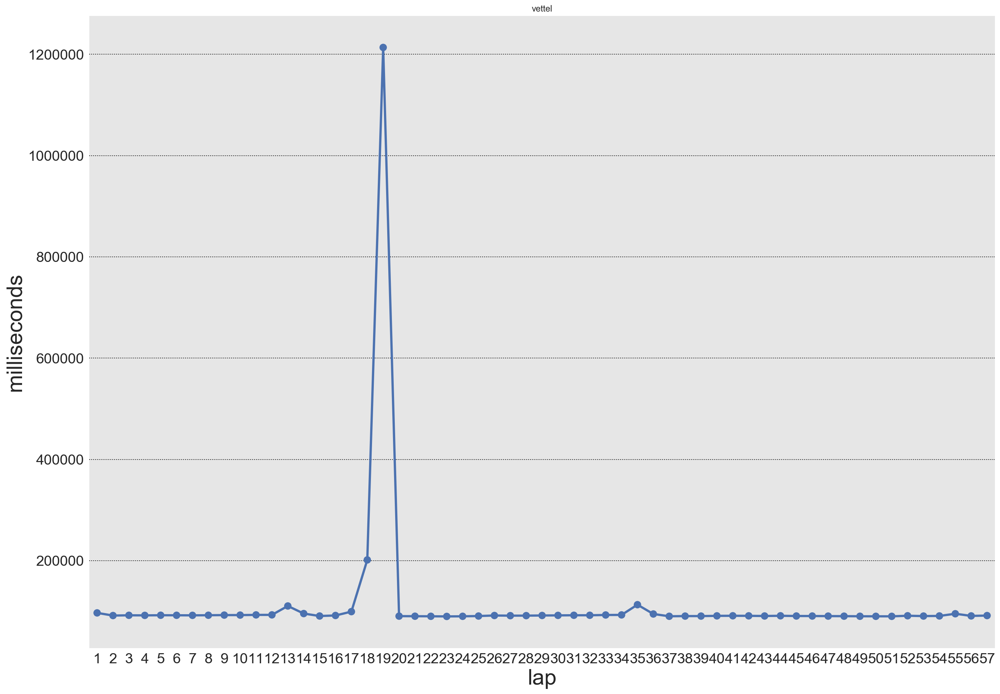

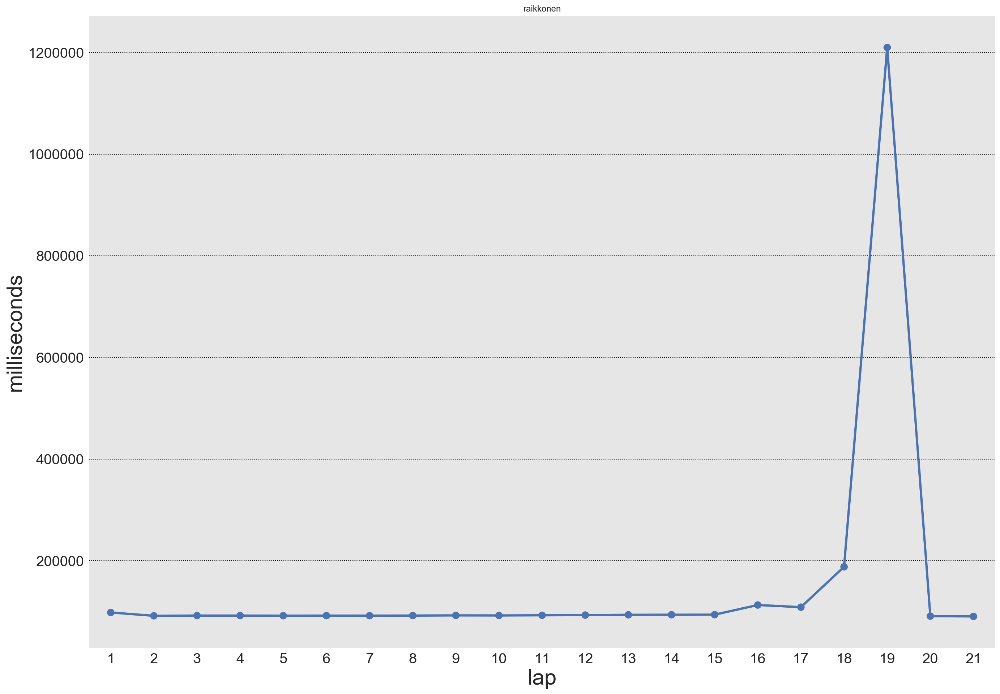

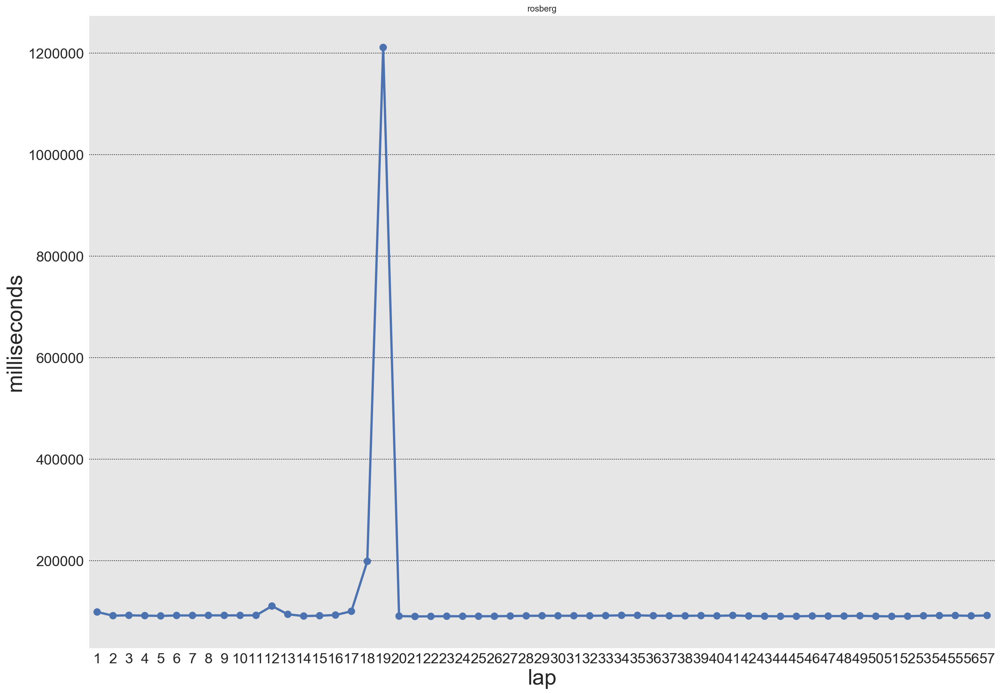

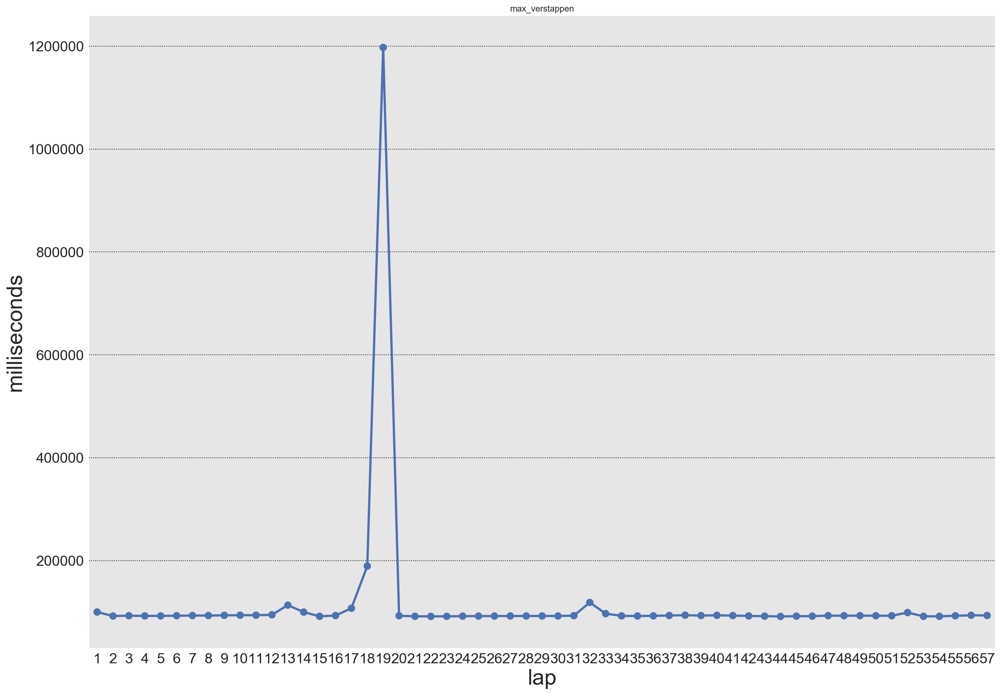

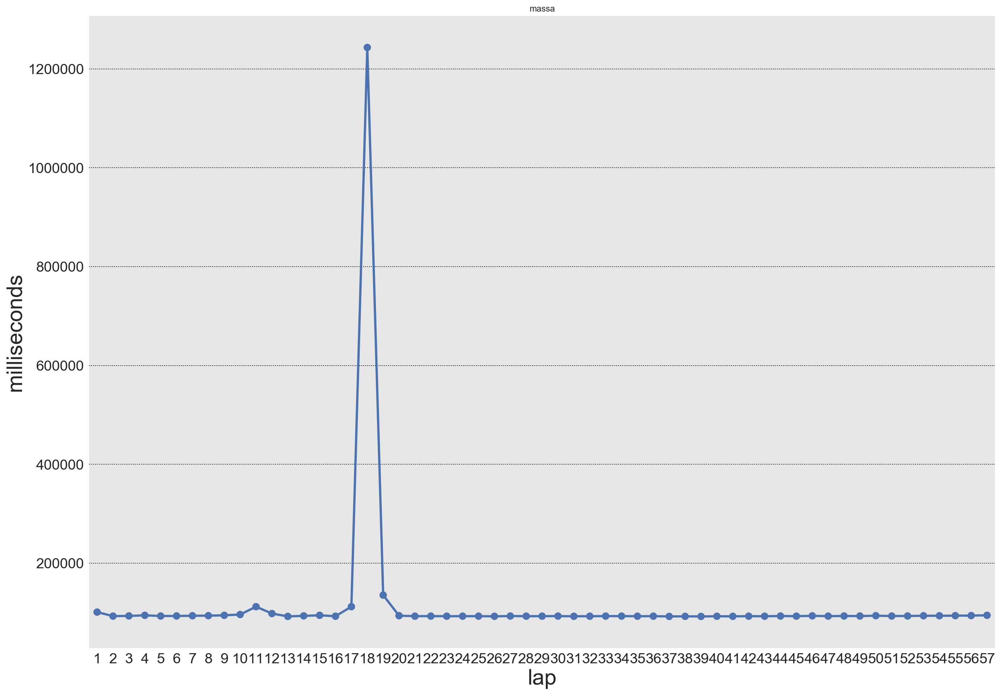

...

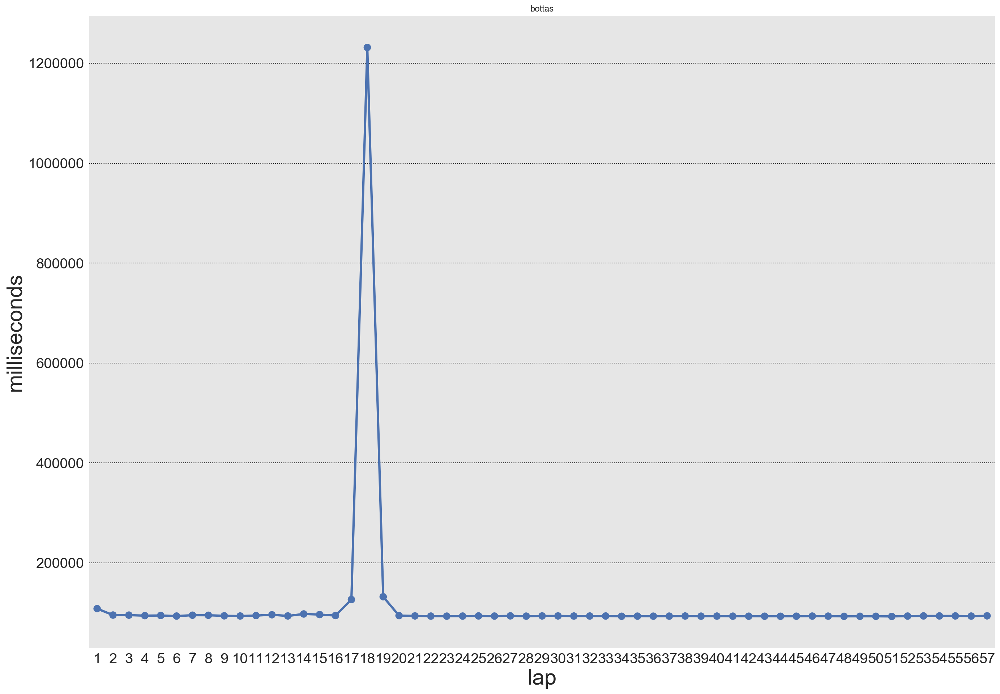

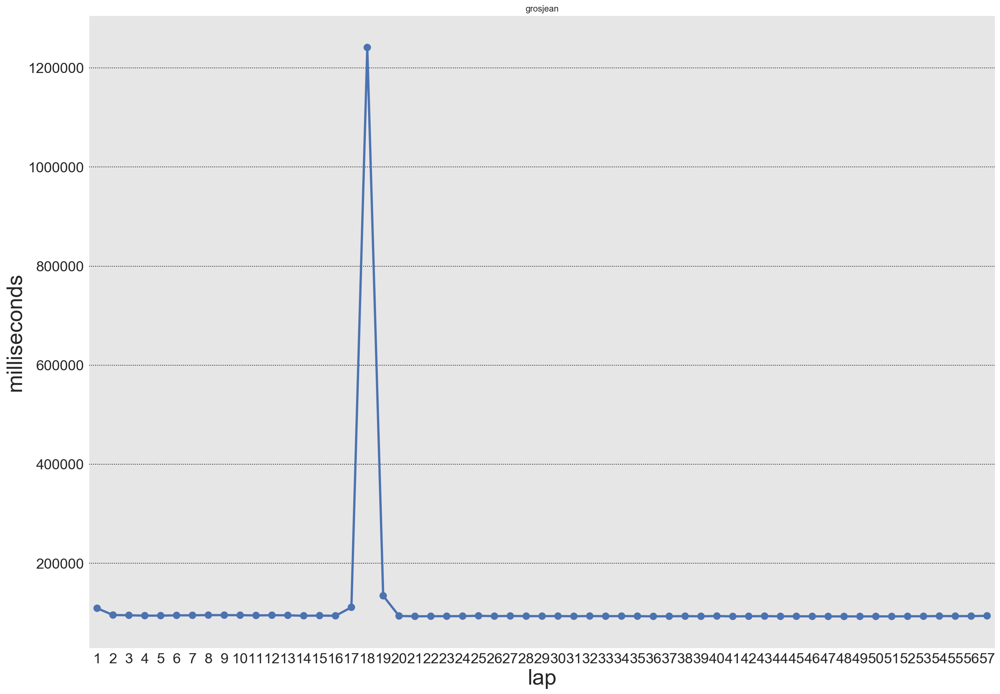

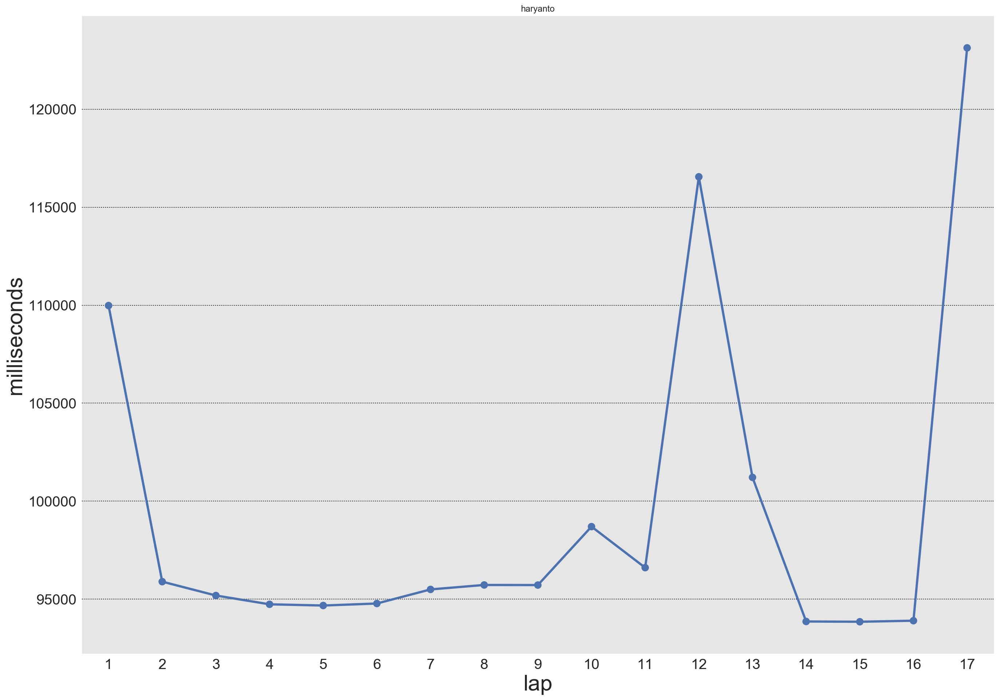

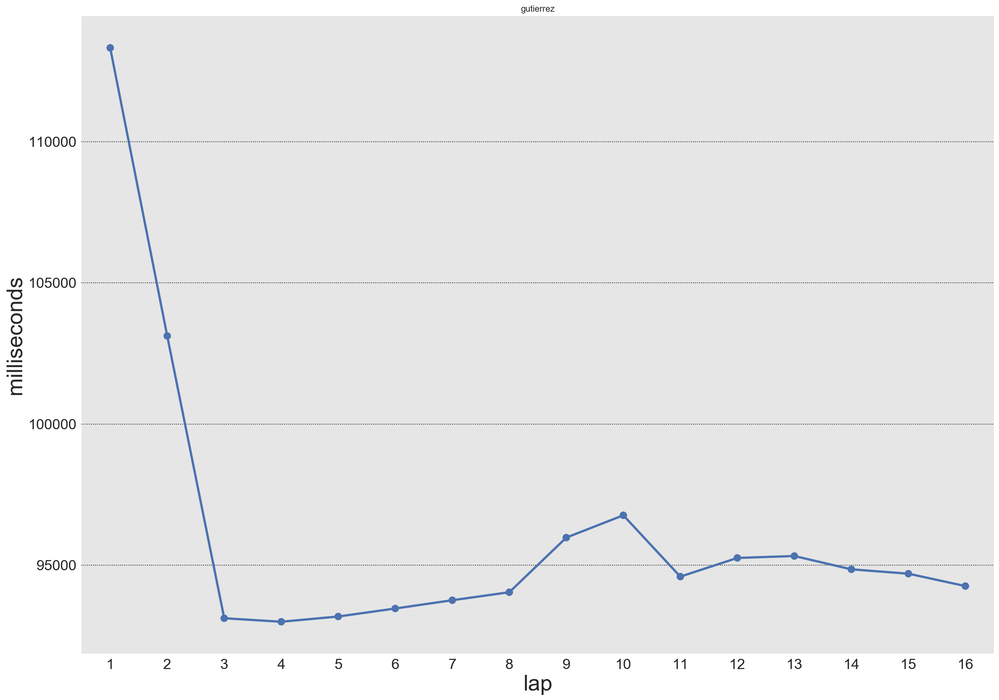

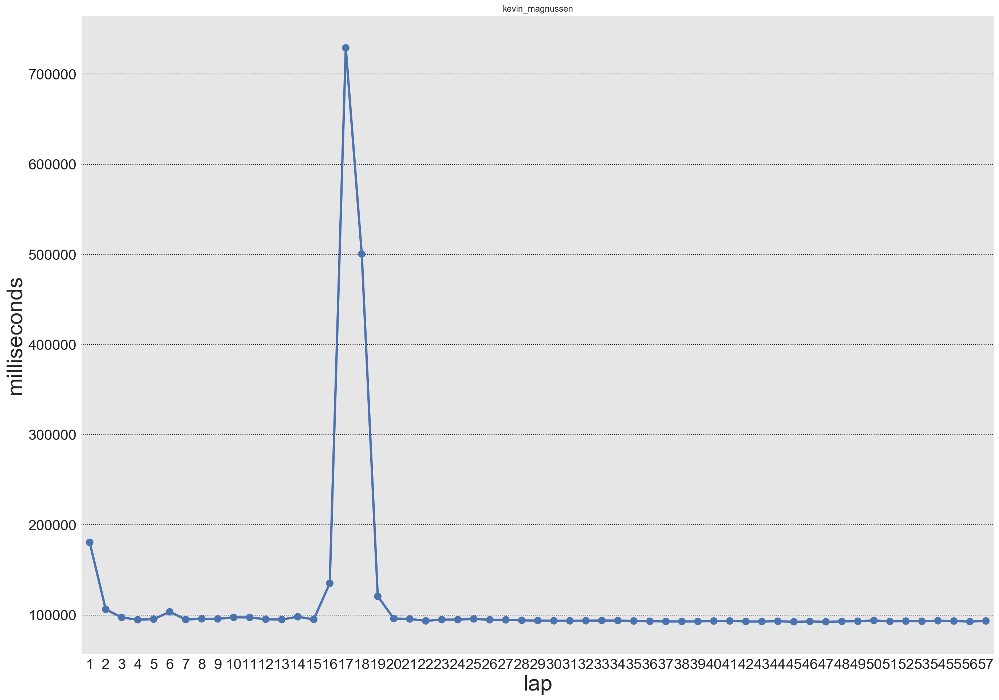

In [24]:
laptime_chart(AUS_2016, data_pitLaps="", function="", time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Lap Time(s)', xlabel = "Lap Time(s)")

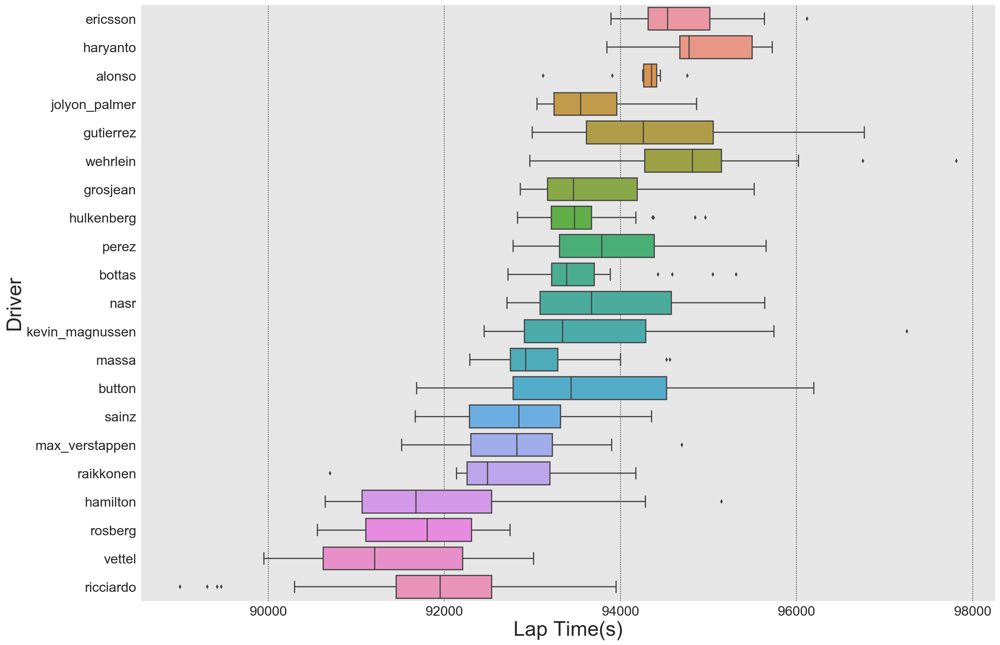

In [25]:
time_box_plot(AUS_2016, filter_outliers_timediff, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)")

In [26]:
data_no_outliers = filter_outliers_timediff(AUS_2016, time_field='milliseconds', id_field='driverRef')
data_no_outliers[data_no_outliers ["driverRef"] == "vettel"]

,index,raceId,driverId,lap,position,time,milliseconds,name,driverRef,time_diff,outlier
2,2,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel,503.0,False
3,3,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel,153.0,False
4,4,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel,259.0,False
5,5,948,20,6,1,1:32.204,92204,Australian Grand Prix,vettel,69.0,False
6,6,948,20,7,1,1:32.080,92080,Australian Grand Prix,vettel,124.0,False
7,7,948,20,8,1,1:32.289,92289,Australian Grand Prix,vettel,209.0,False
8,8,948,20,9,1,1:32.578,92578,Australian Grand Prix,vettel,289.0,False
9,9,948,20,10,1,1:32.571,92571,Australian Grand Prix,vettel,7.0,False
10,10,948,20,11,1,1:32.960,92960,Australian Grand Prix,vettel,389.0,False
11,11,948,20,12,1,1:33.014,93014,Australian Grand Prix,vettel,54.0,False


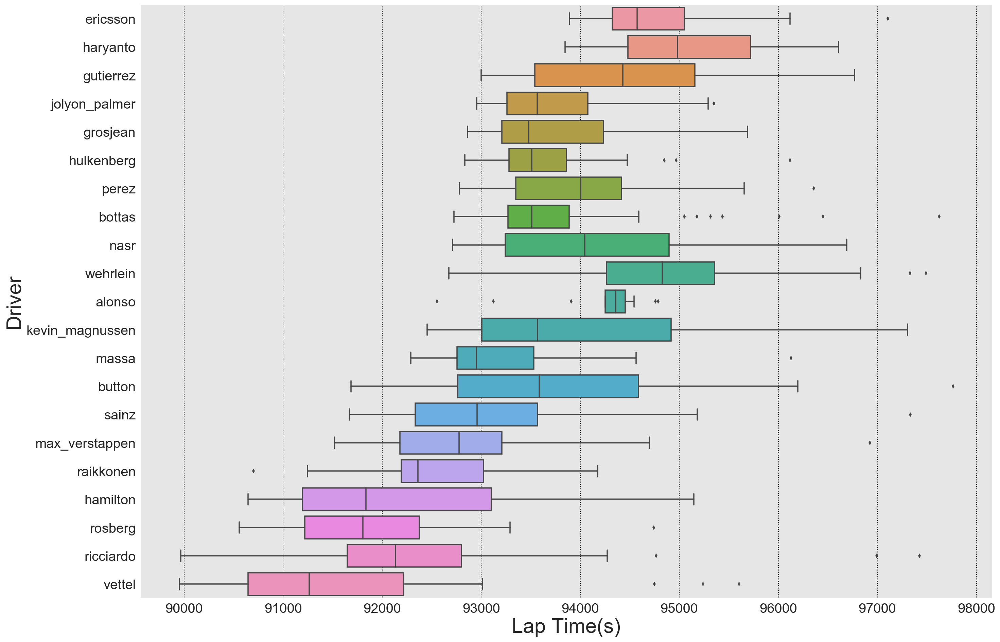

In [27]:
time_box_plot(AUS_2016, filter_outliers_percentile, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)")

#### Example: Vettel at the 2016 Australian Grand Prix

In [28]:
data_no_outliers = filter_outliers_percentile(AUS_2016, time_field='milliseconds', id_field='driverRef')
data_no_outliers[data_no_outliers ["driverRef"] == "vettel"]

,raceId,driverId,lap,position,time,milliseconds,name,driverRef,outlier
1,948,20,2,1,1:31.664,91664,Australian Grand Prix,vettel,False
2,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel,False
3,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel,False
4,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel,False
5,948,20,6,1,1:32.204,92204,Australian Grand Prix,vettel,False
6,948,20,7,1,1:32.080,92080,Australian Grand Prix,vettel,False
7,948,20,8,1,1:32.289,92289,Australian Grand Prix,vettel,False
8,948,20,9,1,1:32.578,92578,Australian Grand Prix,vettel,False
9,948,20,10,1,1:32.571,92571,Australian Grand Prix,vettel,False
10,948,20,11,1,1:32.960,92960,Australian Grand Prix,vettel,False


### Lap Time Variability

In [47]:
def laptime_variability(df):
    resid =  df.groupby(['driverRef', 'raceId']).agg({"milliseconds": "mean"}).rename(columns ={"milliseconds": "mean"}).reset_index()
    df_stdd = pd.merge(df, resid, on=["driverRef", "raceId"], how="left")
    df_stdd['gap'] = df_stdd['milliseconds'] - df_stdd['mean']
    df_std = df_stdd.groupby(['driverRef', 'raceId'])["gap"].apply(lambda x: np.std(x)).reset_index()
    #df_std = data_no_outliers.groupby(['driverRef', 'raceId'])["milliseconds"].apply(lambda x: np.std(x)).reset_index()
    return df_std

In [49]:
laptime_variability(data_no_outliers)

,driverRef,raceId,gap
0,alonso,948,615.642446
1,bottas,948,940.192702
2,button,948,1287.519979
3,ericsson,948,675.097943
4,grosjean,948,818.438537
5,gutierrez,948,1085.351095
6,hamilton,948,1129.597752
7,haryanto,948,853.726972
8,hulkenberg,948,592.035459
9,jolyon_palmer,948,618.496164


### Pit Laps

In [98]:
AUS_2016_pitlaps = filter_pitlaps([2016], "Australian Grand Prix", "", df_pitStops = df_pitStops)
AUS_2016_pitlaps[AUS_2016_pitlaps["driverRef"] == "vettel"]

,raceId,driverId,stop,lap,time,duration,milliseconds,year,name,driverRef
478,948,20,1,13,16:27:17,21.339,21339,2016,Australian Grand Prix,vettel
479,948,20,2,18,16:36:56,18:09.312,1089312,2016,Australian Grand Prix,vettel
480,948,20,3,35,17:21:50,24.548,24548,2016,Australian Grand Prix,vettel


## OVERTAKING

In [213]:
directory = '/Users/dianaow/Documents/formula-1-race-data/dataframes/'
df_overtaking = read_from_pickle(directory)
df_overtaking.head()

,0,1,2,3,4,5,6,7,8,name,year
0,4.0,5.0,Lewis Hamilton,3.0,12,0.0,Felipe Massa,3.0,7,Australian Grand Prix,2016
1,5.0,8.0,Daniel Ricciardo,4.0,7,0.0,Nico Hülkenberg,4.0,11,Australian Grand Prix,2016
2,5.0,16.0,Valtteri Bottas,4.0,12,0.0,Felipe Nasr,4.0,5,Australian Grand Prix,2016
3,9.0,14.0,Valtteri Bottas,8.0,8,0.0,Marcus Ericsson,8.0,2,Australian Grand Prix,2016
4,10.0,6.0,Daniel Ricciardo,9.0,2,0.0,Felipe Massa,9.0,1,Australian Grand Prix,2016


In [214]:
# Since Pit: Full laps since the overtaking driver pitted or started the race
# Until Pit: Full laps until the overtaking driver next pitted or finished the race
# Pit Diff: Difference in number of laps since each driver has pitted or started
# Since Pit: Full laps since the overtaken driver pitted or started the race
# Until Pit: Full laps until the overtaken driver next pitted or finished the race

def overtaking_preprocessing(df):
    
    df = df.rename(columns={ 0:'lap', 1:'position', 2:'overtaker', 3:'overtaker: since pit', 4:'overtaker: until pit', \
                                                   5:'pit diff', 6:'overtaken', 7:'overtaken: since pit', 8:'overtaken: until pit'})

    df['lap'] = df['lap'].astype(int)
    
    df_overtaken = df.loc[:,["lap","position","overtaker","overtaker: since pit","overtaker: until pit","name","year"]]
    df_overtaker = df.loc[:,["lap","position","overtaken","overtaken: since pit","overtaken: until pit","name","year"]]
    df_new = pd.concat([df_overtaken, df_overtaker])
    
    df_new["clear lap?"] = ["overtaken" if pd.isnull(row['overtaker']) else "overtaker" for index,row in df_new.iterrows()]
    df_new['overtaken'] = df_new['overtaken'].fillna(df_new['overtaker'])
    df_new['overtaken: since pit'] = df_new['overtaken: since pit'].fillna(df_new['overtaker: since pit'])
    df_new['overtaken: until pit'] = df_new['overtaken: until pit'].fillna(df_new['overtaker: until pit'])
    df_new = df_new.rename(columns={ "overtaken" :'driverRef', "overtaken: since pit": "since pit", 'overtaken: until pit': "until pit"})
    
    df_new['driverRef'] = df_new['driverRef'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
    df_new['driverRef'] = [row.split(' ', 1 )[1].lower() for row in df_new['driverRef']]
    df_new['driverId'] = df_new['driverRef'].map(drivers_dict)
    df_new['year'] = pd.to_numeric(df_new['year'], errors='coerce')
    df_new = df_new.drop(['overtaker', 'overtaker: since pit', 'overtaker: until pit'], axis=1)
    
    df_new = pd.merge(df_new, df_races[['raceId','name', 'year']], on=['name', 'year'], how="left")
    
    return df_new

In [215]:
overtaking_preprocessing(df_overtaking)

,lap,name,driverRef,since pit,until pit,position,year,clear lap?,driverId,raceId
0,4,Australian Grand Prix,hamilton,3.0,12,5.0,2016,overtaker,1,948
1,5,Australian Grand Prix,ricciardo,4.0,7,8.0,2016,overtaker,817,948
2,5,Australian Grand Prix,bottas,4.0,12,16.0,2016,overtaker,822,948
3,9,Australian Grand Prix,bottas,8.0,8,14.0,2016,overtaker,822,948
4,10,Australian Grand Prix,ricciardo,9.0,2,6.0,2016,overtaker,817,948
5,10,Australian Grand Prix,bottas,9.0,7,13.0,2016,overtaker,822,948
6,10,Australian Grand Prix,grosjean,9.0,8,16.0,2016,overtaker,154,948
7,10,Australian Grand Prix,sainz,1.0,8,19.0,2016,overtaker,832,948
8,10,Australian Grand Prix,sainz,1.0,8,18.0,2016,overtaker,832,948
9,10,Australian Grand Prix,gutierrez,9.0,Unknown,19.0,2016,overtaker,821,948


## TYRE DEGRADATION 

In [216]:
import pandas as pd
xl = pd.ExcelFile("./formula-1-race-data/F1_Tyre_Data.xlsx")
xl.sheet_names
tyres = xl.parse("Sheet2")

In [245]:
tyres_dict = {"Ultra soft": "option", 
              "Super soft": "option", 
              "Soft": "option", 
              "Medium": "prime",
              "Hard": "prime",
              "Wet": "option",
              "Intermediate" : "option",
              "Used Supersoft": "option", 
              "Used Soft": "option", 
             }

In [217]:
def tyre_use_race(df, year, race_name, driver_name):
    
    df = df.iloc[:, 0:12]
    df.columns = [x.lower() for x in df.columns]
    df_race = df_races[df_races['year'].isin(year)]
    df_lapTimes_race = df_lapTimes.loc[df_lapTimes['raceId'].isin(df_race['raceId'])]
    df["driverRef"] = [row.split(' ', 1 )[1].lower() for row in df['driver']]
    df = df.rename(columns = {'race': 'name'})
    
    if race_name and driver_name:
        grouped_race = df.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df.groupby("driverRef").get_group(driver_name)
    else: 
        data = df
    
    df = pd.merge(df, df_races[["year", "name", "raceId"]], left_on=['year', 'name'], right_on=['year', 'name'])
    df = pd.merge(df, df_drivers[['driverRef', 'driverId']], left_on=['driverRef'], right_on=['driverRef'])
    df = df.rename(columns={'stint': 'stint 1', 'stint.1': 'stint 2', 'stint.2': 'stint 3', 'stint.3': 'stint 4'})
    df.drop('driver', axis=1, inplace=True)
        
    return df

In [225]:
def tyre_use_race_laptimes(df, df_tyres):
    
    df = pd.merge(df, df_tyres, on=['raceId', 'driverId', 'name', 'driverRef'])
    
    df['stint 1+2'] = df['stint 1'] + df['stint 2']
    df['stint 1+2+3'] = df['stint 1'] + df['stint 2'] + df['stint 3']
    df['stint 1+2+3+4'] = df['stint 1'] + df['stint 2'] + df['stint 3'] + df['stint 4']
    
    df['tyre'] = np.where((df['lap'] <= df['stint 1']), df['first set'], np.nan)
    df['tyre2'] = np.where((df['lap'] > df['stint 1']) & (df['lap'] <= df['stint 1+2']), df['second set'], np.nan)
    df['tyre3'] = np.where((df['lap'] > df['stint 1+2']) & (df['lap'] <= df['stint 1+2+3']), df['third set'], np.nan)
    df['tyre4'] = np.where((df['lap'] > df['stint 1+2+3']) & (df['lap'] <= df['stint 1+2+3+4']), df['fourth set'], np.nan)
    
    df['tyre'].fillna(df['tyre2'], inplace=True)
    df['tyre'].fillna(df['tyre3'], inplace=True)
    df['tyre'].fillna(df['tyre4'], inplace=True)
    
    df.drop(['stint 1+2', 'stint 1+2+3', 'stint 1+2+3+4', 'tyre2', 'tyre3', 'tyre4', 'session'], axis=1, inplace=True)
    
    #df = pd.concat([df.iloc[:, 0:9], df.iloc[:, 18:]], axis=1)

    return df

In [226]:
AUS_2016_tyres = tyre_use_race(tyres, [2016], "Australian Grand Prix", "")
AUS_2016_tyres_laptimes = tyre_use_race_laptimes(AUS_2016, AUS_2016_tyres)
AUS_2016_tyres_laptimes

,raceId,driverId,lap,position,time,milliseconds,name,driverRef,year,first set,stint 1,second set,stint 2,third set,stint 3,fourth set,stint 4,tyre
0,948,20,1,1,1:36.916,96916,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
1,948,20,2,1,1:31.664,91664,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
2,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
3,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
4,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
5,948,20,6,1,1:32.204,92204,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
6,948,20,7,1,1:32.080,92080,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
7,948,20,8,1,1:32.289,92289,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
8,948,20,9,1,1:32.578,92578,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft
9,948,20,10,1,1:32.571,92571,Australian Grand Prix,vettel,2016,Super soft,13.0,Super soft,22.0,Soft,22.0,NaN,NaN,Super soft


In [246]:
def master_table(df, df_pitLaps, df_overtaking):
    
    # MERGE PITLAPS DATAFRAME
    df_pitLaps = df_pitLaps.drop(['duration'], axis=1)
    df_pitLaps = df_pitLaps.rename(columns = {'milliseconds': 'duration'})
    cols_to_use = df_pitLaps.columns.difference(df.columns)
    df_pitLaps = pd.concat([df_pitLaps[cols_to_use], df_pitLaps[['raceId', 'driverId','lap']]], axis=1)
    df = pd.merge(df, df_pitLaps, on=['raceId', 'driverId','lap'], how='left')
    
    # INSERT QUALIFYING POSITION
    df_qualifying.rename(columns = {'position': 'qual position'}, inplace=True)
    df = pd.merge(df, df_qualifying[['raceId', 'driverId', 'qual position']], on=['raceId', 'driverId'])
    
    # MERGE OVERTAKING DATAFRAME
    df_overtaking_dropped = df_overtaking.drop(['driverRef', 'position', 'name', 'year'] , axis=1)
    df = pd.merge(df, df_overtaking_dropped, on=['raceId', 'driverId','lap'], how='left')
    
    # MAP TYRE COMPOUND TYPE
    df['compound'] = df['tyre'].map(tyres_dict)
    
    return df

In [247]:
df_overtaking_preprocessed = overtaking_preprocessing(df_overtaking)
AUS_2016_no_outliers = filter_outliers_percentile(AUS_2016)
no_outliers = tyre_use_race_laptimes(AUS_2016_no_outliers, AUS_2016_tyres)
df_R_2016 = master_table(no_outliers, AUS_2016_pitlaps, df_overtaking_preprocessed)
df_R_2016

,raceId,driverId,lap,position,time,milliseconds,name,driverRef,outlier,year,...,fourth set,stint 4,tyre,duration,stop,qual position,since pit,until pit,clear lap?,compound
0,948,20,2,1,1:31.664,91664,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
1,948,20,3,1,1:32.167,92167,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
2,948,20,4,1,1:32.014,92014,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
3,948,20,5,1,1:32.273,92273,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
4,948,20,6,1,1:32.204,92204,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
5,948,20,7,1,1:32.080,92080,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
6,948,20,8,1,1:32.289,92289,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
7,948,20,9,1,1:32.578,92578,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
8,948,20,10,1,1:32.571,92571,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option
9,948,20,11,1,1:32.960,92960,Australian Grand Prix,vettel,False,2016,...,NaN,NaN,Super soft,NaN,NaN,3,NaN,NaN,NaN,option


In [127]:
def plot_tyre_degration(df):
    df = df[df["clear lap?"].isnull() & df["stop"].isnull()]
    for index, driver in enumerate(df_R_2016["driverRef"].unique()):
        ax = plt.figure()
        p = sns.lmplot(x="lap", y="milliseconds", data=df[df["driverRef"] == driver], hue="tyre", size= 20, truncate=True)
        leg = p.axes[0, 0].get_legend()
        ax = plt.gca()
        ax.set_title(driver)


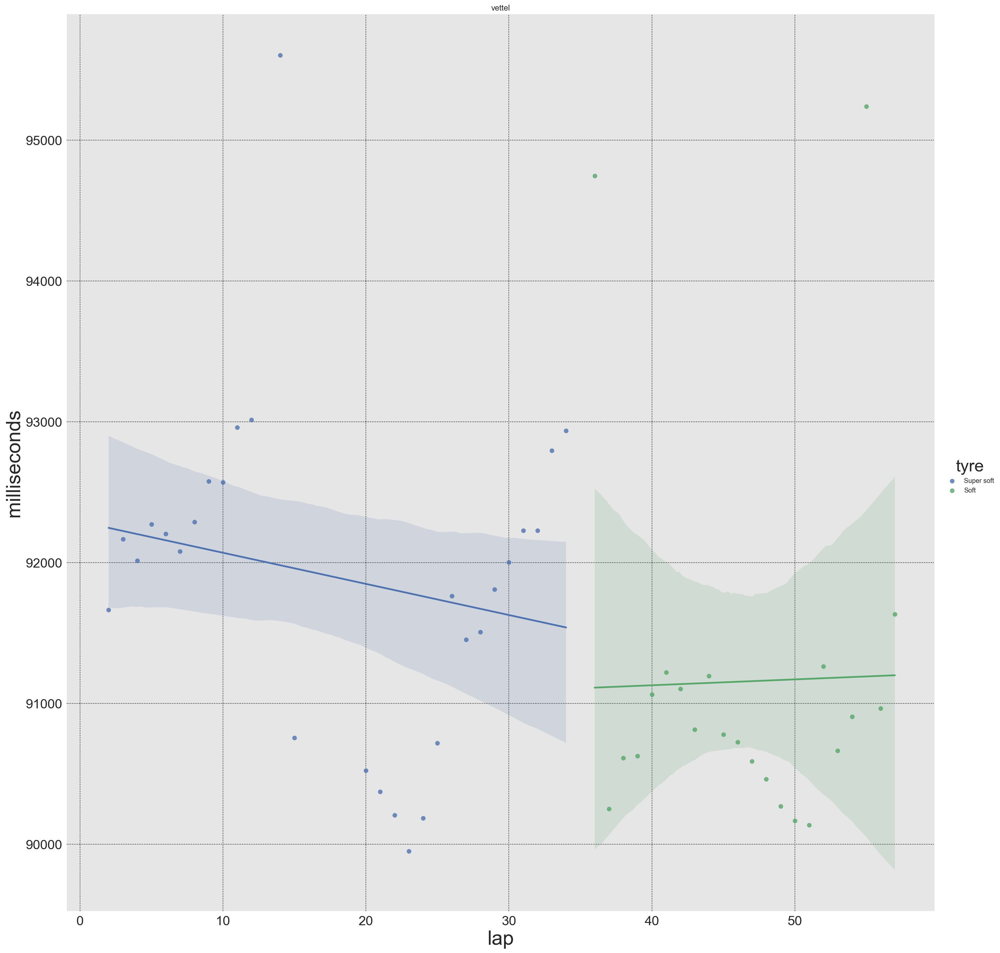

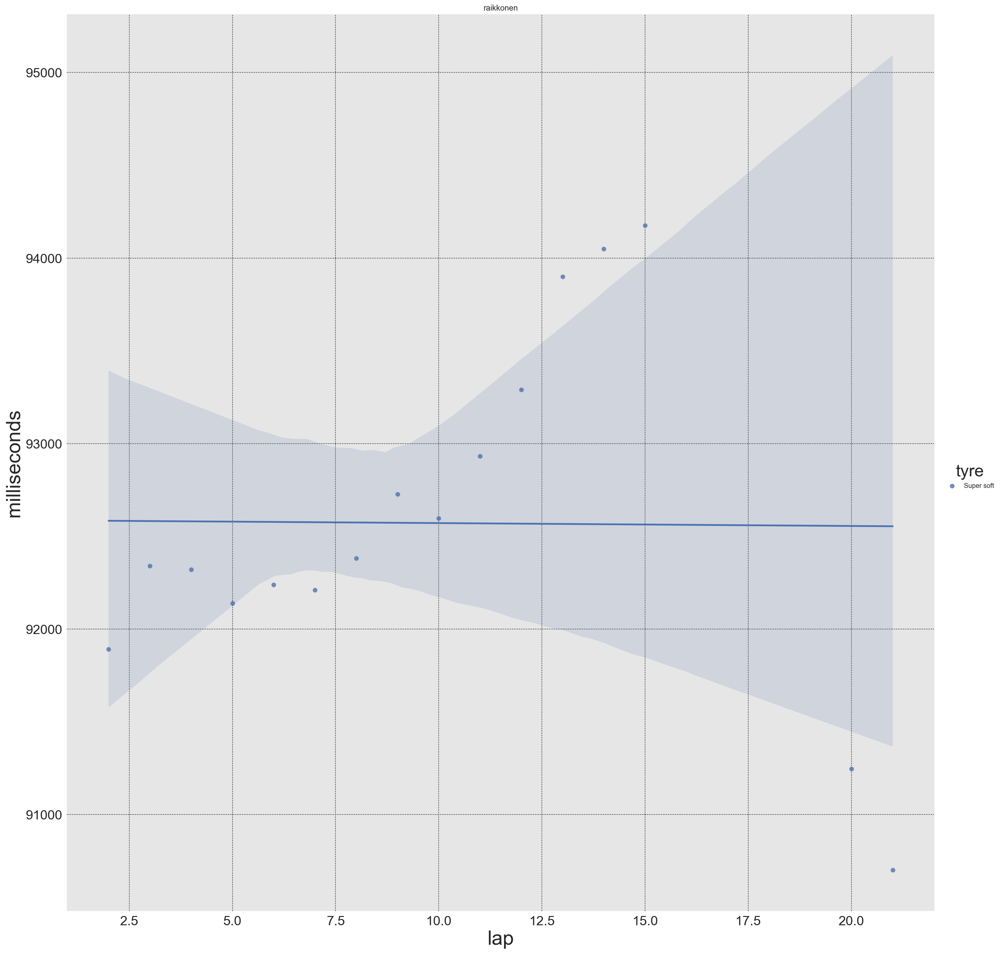

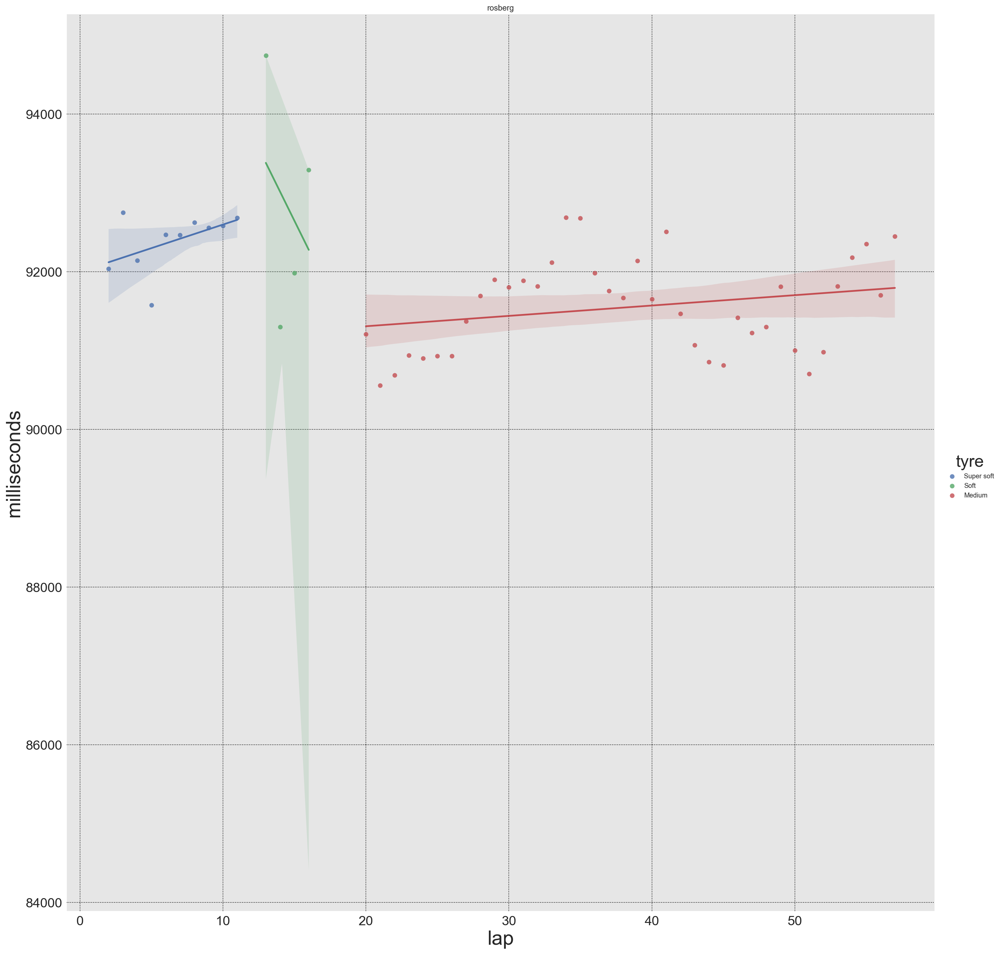

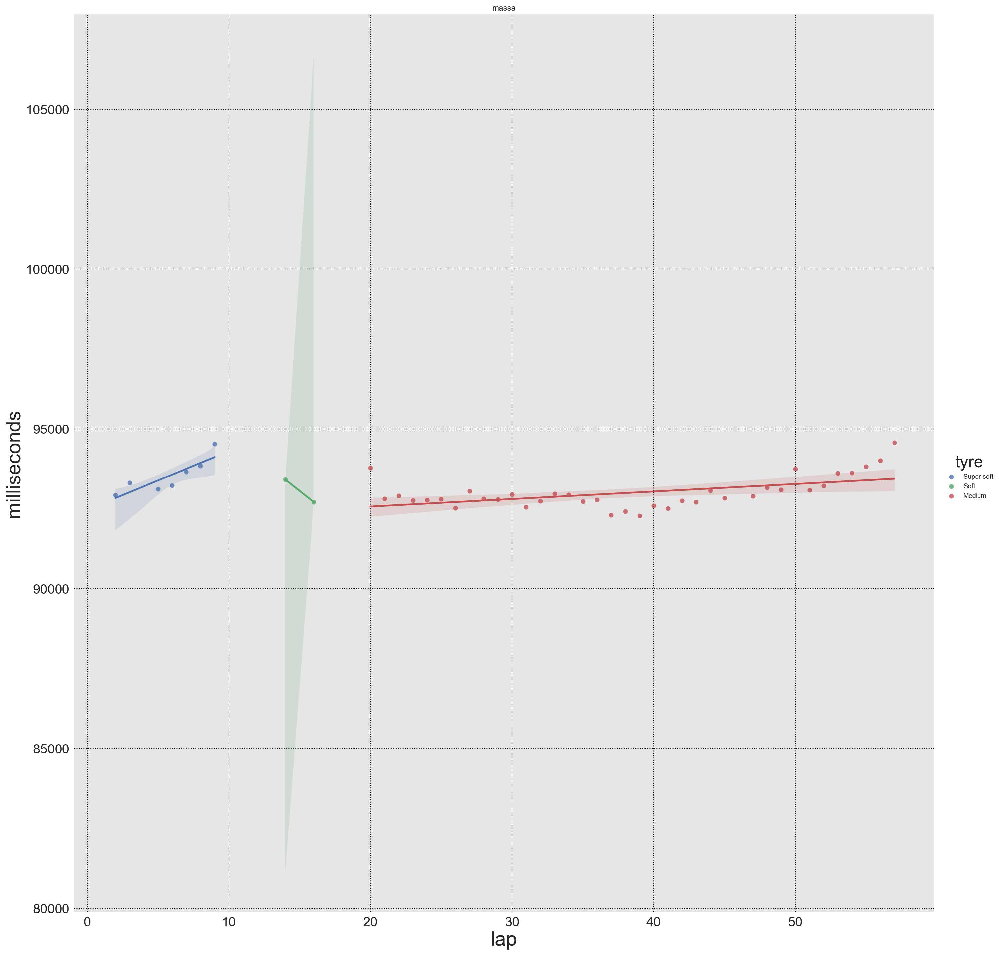

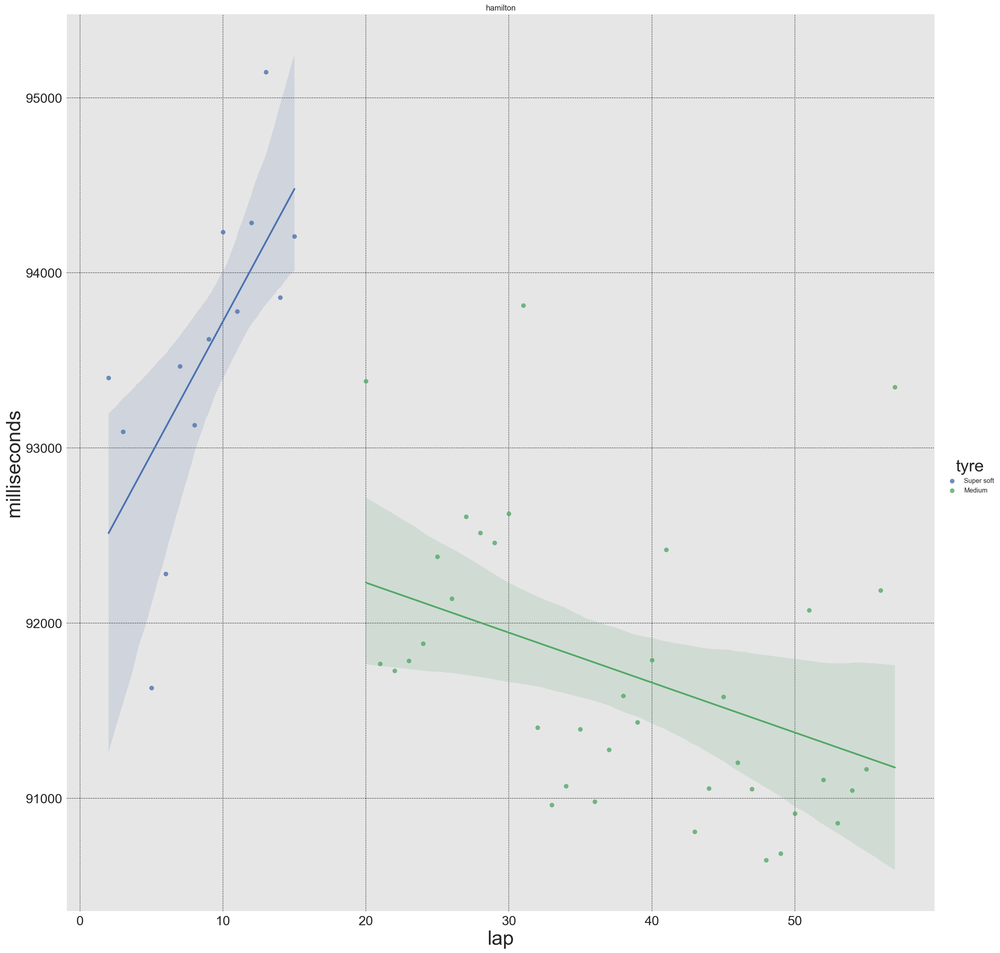

...

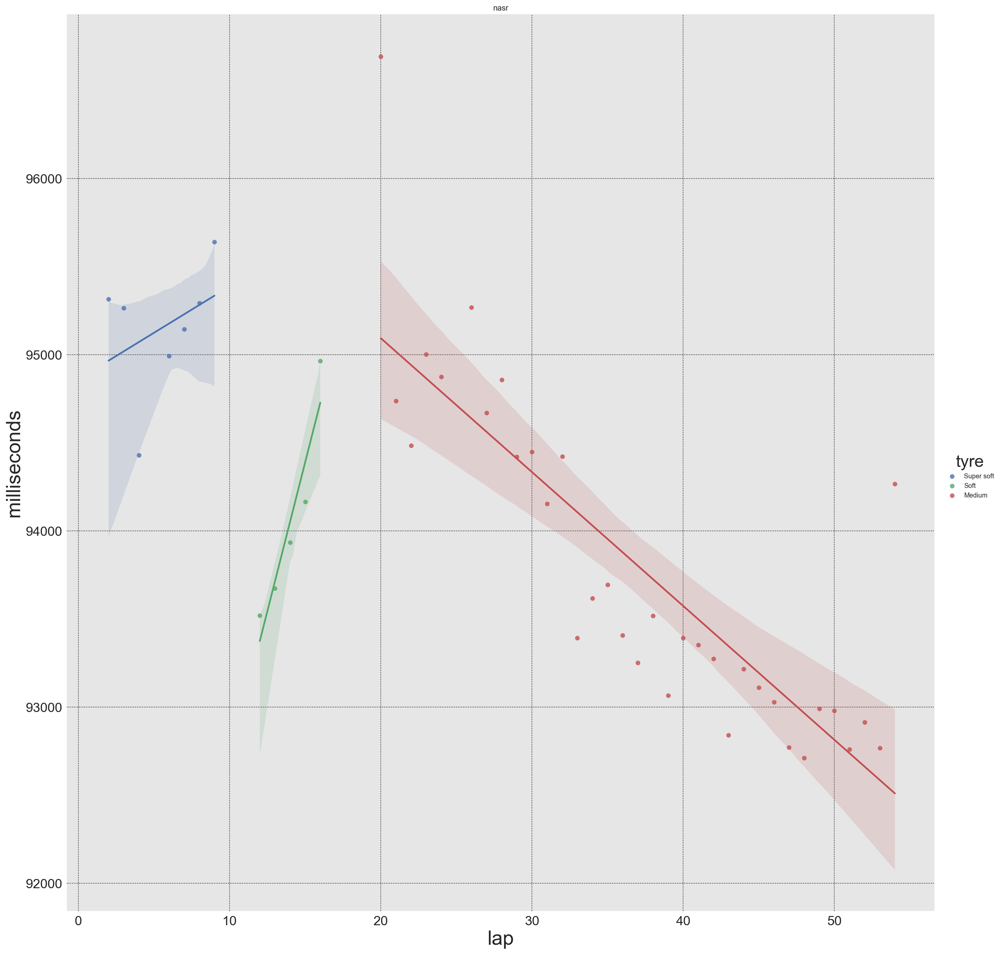

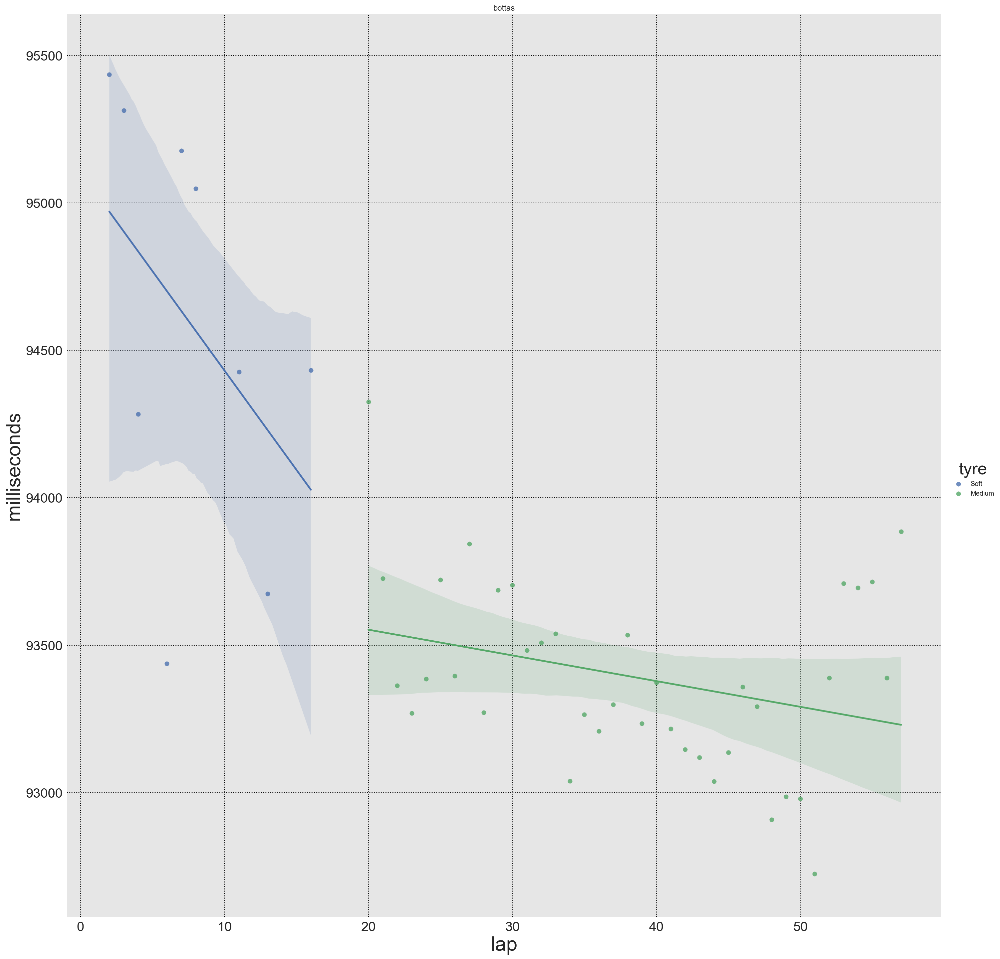

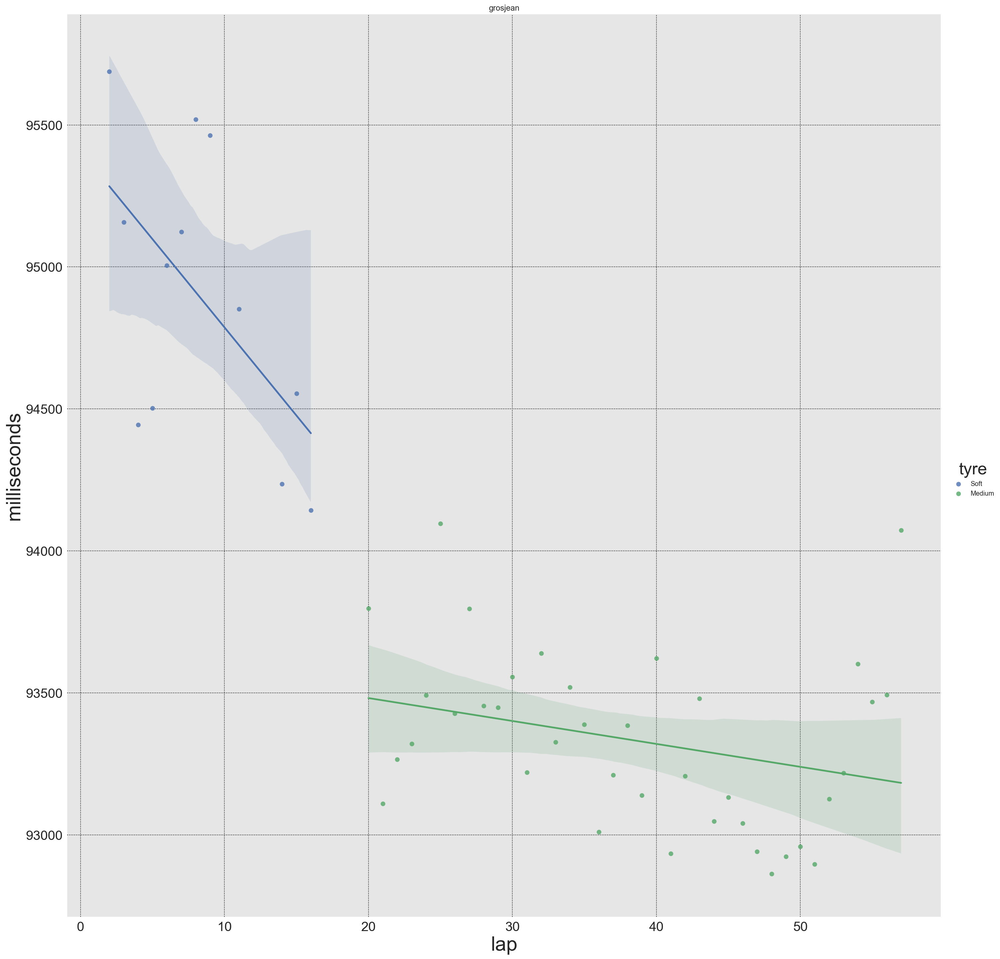

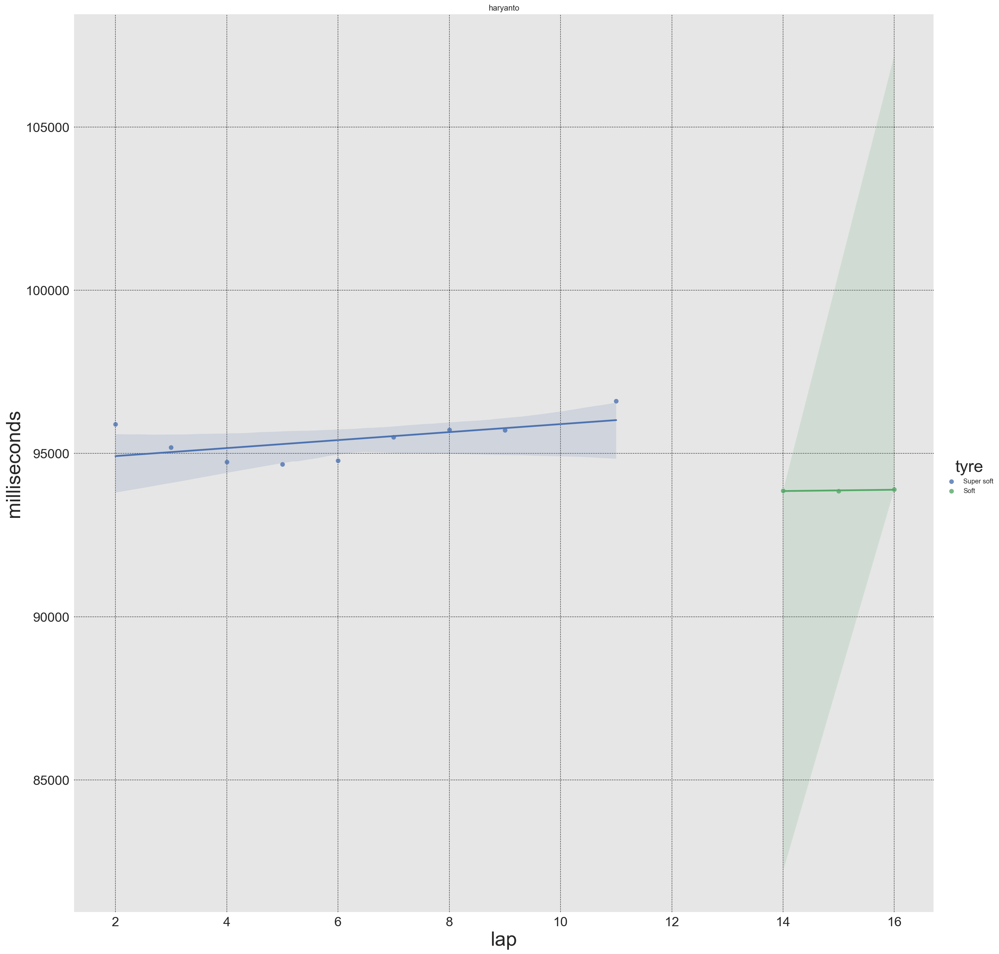

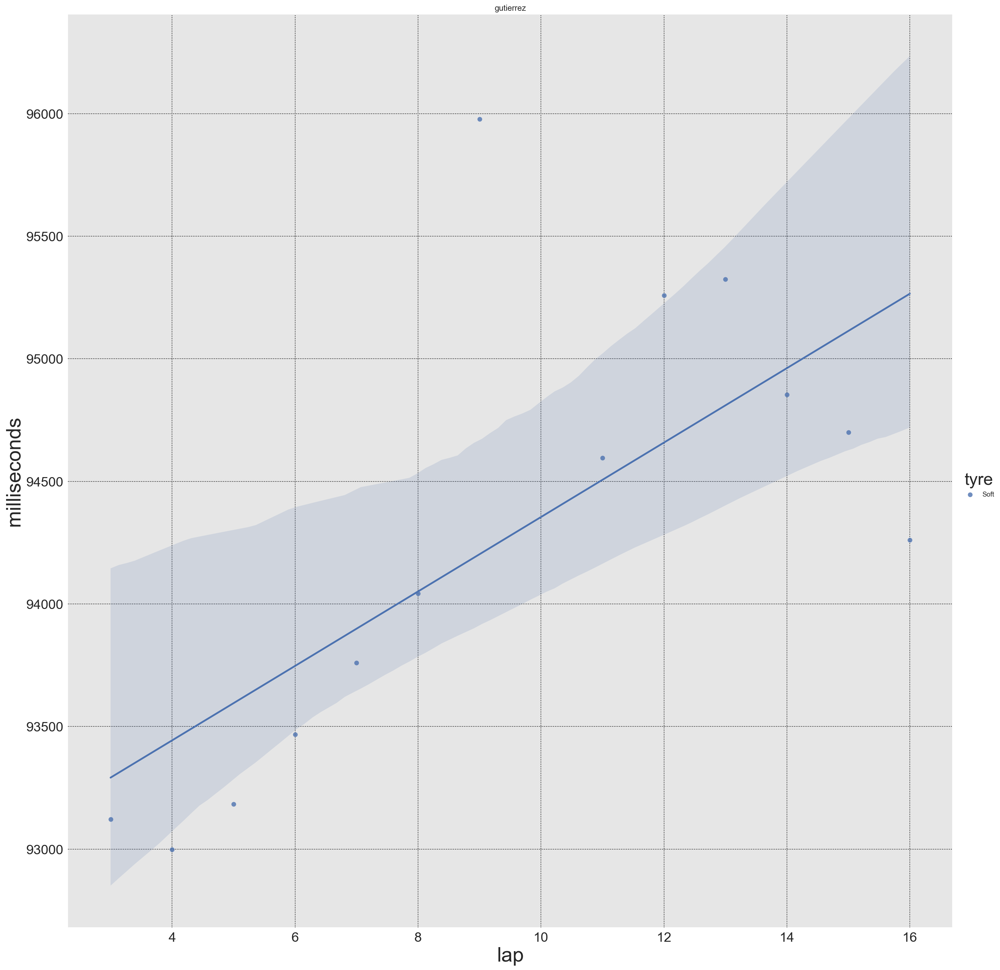

In [166]:
plot_tyre_degration(df_R_2016)

In [ ]:
def indiv_lin_reg(data):
    """Returns individual linear regression coefficients for each driver in each race"""
    
    coeffs = []
    intercepts = []
    driver_coeffs_intercepts = {}
    dfs = pd.DataFrame()
    
    drivers = data['driverRef'].unique()
    compounds = data['compound'].unique()
    
    for driver, comp in groupby(drivers, compounds):
    #for driver, comp in itertools.izip_longest(drivers, itertools.cycle(compounds)):
        print driver
        print comp
        #drivers.append(driver)
        #compounds.append(comp)
    

    #return drivers

In [ ]:
        data.groupby(['driverRef', 'compound']).get_group((driver, comp)).reset_index()
        x = data['lap'].values.reshape(-1, 1)
        y = data['milliseconds']
        linreg = LinearRegression(fit_intercept=True)
        linreg.fit(x, y)
        coeffs.append(linreg.coef_)
        intercepts.append(linreg.intercept_)  
        driver_coeffs_intercepts = pd.DataFrame(
                                    {'driver': drivers,
                                     'compound': compounds,
                                     'coeffs': coeffs,
                                     'intercept': intercepts
                                    })


In [314]:
df_R_2016.groupby(['driverRef', 'compound']).get_group(("vettel", "option")).reset_index()
x = df_R_2016['lap'].values.reshape(-1, 1)
y = df_R_2016['milliseconds']
linreg = LinearRegression(fit_intercept=True)
linreg.fit(x, y)
print linreg.coef_
print linreg.intercept_

[-30.43344043]
94228.9886049


In [ ]:
indiv_lin_reg(df_R_2016)

In [ ]:
# Polynomial function
x = no_outliers['lap']
y = [1, x, x_2 ** 2, x_2 ** 3, ...], ...]

#### U-curve: A crossover point occurs for the option tyre, where it becomes slower than a fresh prime tyre. 
#### A driver who switches to fresh prime tyres at this point may be able to undercut a competitor who stays out longer on options.

In [241]:
def no_unfinished_stints(df, df_statusId):
    
    df = pd.merge(df, df_statusId, on=["raceId", "driverId"], how='left')
    df = df[df["stop"].notnull()]
    for i, row in df.iterrows():
        X = "unfinished"
        if row['statusId'] != 1.:
            if row['stop'] == 4.:
                df.loc[i, 'stint 4']=X
            elif row['stop'] == 3.:
                df.loc[i, 'stint 3']=X
            elif row['stop'] == 2.:
                df.loc[i, 'stint 2']=X
            elif row['stop'] == 1.:
                df.loc[i, 'stint 1']=X
    
    df = df.replace(X, np.nan)
    
    firstset = df.groupby(["driverRef", "first set"])["stint 1"].agg(['mean']).reset_index()
    firstset["set"] = "first"
    secondset = df.groupby(["driverRef", "second set"])["stint 2"].agg(['mean']).reset_index()
    secondset["set"] = "second"
    thirdset = df.groupby(["driverRef", "third set"])["stint 3"].agg(['mean']).reset_index()
    thirdset["set"] = "third"
    fourthset = df.groupby(["driverRef", "fourth set"])["stint 4"].agg(['mean']).reset_index()
    fourthset["set"] = "fourth"
    
    df = pd.concat([firstset, secondset, thirdset, fourthset])
    
    df['first set'].fillna(df['second set'], inplace=True)
    df['first set'].fillna(df['third set'], inplace=True)
    df['first set'].fillna(df['fourth set'], inplace=True)
    
    df = df.drop(['second set', 'third set', 'fourth set'], axis=1).rename(columns={"first set": "tyre"})    
    df['compound'] = df['tyre'].map(tyres_dict)
                
    return df

In [188]:
f = "./formula-1-race-data/dataframes/df_statusId.pickle"
with open(f, 'rb') as file:
    df_statusId = pickle.load(file)

In [189]:
df_statusId.head()

,driverId,raceId,stop,laps,statusId
0,1,948,2.0,57,1
1,1,949,3.0,57,1
2,1,950,5.0,56,1
3,1,951,1.0,53,1
4,1,953,1.0,78,1


In [242]:
no_unfinished_stints(AUS_2016_tyres, df_statusId)

,driverRef,tyre,mean,set,compound
0,alonso,Medium,9.000000,first,prime
1,alonso,Soft,12.000000,first,option
2,alonso,Super soft,12.000000,first,option
3,alonso,Ultra soft,10.500000,first,option
4,alonso,Wet,9.333333,first,option
5,bottas,Medium,27.500000,first,prime
6,bottas,Soft,14.500000,first,option
7,bottas,Super soft,10.500000,first,option
8,bottas,Ultra soft,11.000000,first,option
9,bottas,Wet,9.666667,first,option


In [243]:
def stint_table(df):
    
    df_overall = df.groupby(["driverRef"])["mean"].agg(['mean']).reset_index()
    df_compound = df.groupby(["driverRef", "compound"])["mean"].agg(['mean']).reset_index()
    df_compound = df_compound.rename(columns = {"mean": "overall mean"})
    df = pd.merge(df_overall, df_compound, on='driverRef')
    
    df['ratio: by compound'] = df["mean"] / df['overall mean']
    df['avg ratio'] = df.groupby("driverRef").agg({"ratio: by compound": "mean"})
    
    return df

In [244]:
stint_table(no_unfinished_stints(AUS_2016_tyres, df_statusId))

,driverRef,mean,compound,overall mean,ratio: by compound,avg ratio
0,alonso,17.349248,option,17.606593,0.985384,NaN
1,alonso,17.349248,prime,16.791667,1.033206,NaN
2,bottas,19.649554,option,15.285714,1.285485,NaN
3,bottas,19.649554,prime,29.250000,0.671780,NaN
4,button,17.435185,option,13.544872,1.287217,NaN
5,button,17.435185,prime,27.550000,0.632856,NaN
6,ericsson,16.842593,option,12.448718,1.352958,NaN
7,ericsson,16.842593,prime,28.266667,0.595846,NaN
8,grosjean,21.318254,option,20.100649,1.060575,NaN
9,grosjean,21.318254,prime,24.666667,0.864254,NaN


### Tyre Degradation Model

- From the quadratic tyre degradation function, I include a tyre degradation multiplier based on this table. For example, Perez has run 1.08 times longer than the average driver overall. I therefore divided his degradation rate by a factor of 1.08.
- LapTime = ForecastedPrimeTime + Random (add back the std dev) + TyreDeg

#### Pickle dataframes...

In [ ]:
file_name = "all2016races.pickle"
file_path = os.path.join(directory, file_name)
df_R_2015_2016.to_pickle(file_path)

In [ ]:
file_name = "all2016races_all_laps.pickle"
file_path = os.path.join(directory, file_name)
df_2015_2016_tyres_laptime.to_pickle(file_path)

In [ ]:
df_2016_tyre_use = tyre_use_race(df_tyres, [2016], "", "")
file_name = "df_2016_tyre_use.pickle"
file_path = os.path.join(directory, file_name)
df_2016_tyre_use.to_pickle(file_path)